In [2]:
import os
import cv2  # OpenCV for image processing
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
from tqdm import tqdm
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px

In [3]:
class Paths:
  images_path = 'planttraits2024/train_images'
  output_path = 'output'

In [4]:
def get_means(folder_path):
  data = []

  for filename in tqdm(os.listdir(folder_path)):
    img = cv2.imread(os.path.join(folder_path, filename))
    mean = cv2.mean(img)[:3]
    data.append(mean)

  return data

In [5]:
def plot_means(means):
    means = list(zip(*means))

    fig = plt.figure()
    fig.set_figheight(15)
    fig.set_figwidth(15)

    for x in range(3):
      for y in range(3):
        if x == y:
          continue

        ax = fig.add_subplot(330 + 3 * x + y + 1)

        ax.scatter(means[x], means[y], s=.1)

        ax.set_xlabel(['Red', 'Green', 'Blue'][x] + ' Mean')
        ax.set_ylabel(['Red', 'Green', 'Blue'][y] + ' Mean')

    # plt.title('Mean Color Distribution of Images')
    plt.show()

In [6]:
means = get_means(Paths.images_path)

100%|██████████| 55489/55489 [05:26<00:00, 169.90it/s]


In [7]:
means = np.array(means)
means.shape

(55489, 3)

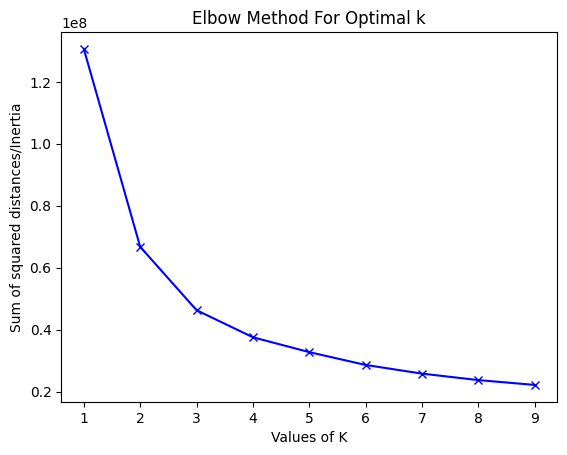

In [8]:
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
  kmeans = KMeans(n_clusters=num_clusters)
  kmeans.fit(means)
  Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K, Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [9]:
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(means)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 55489 samples in 0.063s...


[t-SNE] Computed neighbors for 55489 samples in 2.398s...
[t-SNE] Computed conditional probabilities for sample 1000 / 55489
[t-SNE] Computed conditional probabilities for sample 2000 / 55489
[t-SNE] Computed conditional probabilities for sample 3000 / 55489
[t-SNE] Computed conditional probabilities for sample 4000 / 55489
[t-SNE] Computed conditional probabilities for sample 5000 / 55489
[t-SNE] Computed conditional probabilities for sample 6000 / 55489
[t-SNE] Computed conditional probabilities for sample 7000 / 55489
[t-SNE] Computed conditional probabilities for sample 8000 / 55489
[t-SNE] Computed conditional probabilities for sample 9000 / 55489
[t-SNE] Computed conditional probabilities for sample 10000 / 55489
[t-SNE] Computed conditional probabilities for sample 11000 / 55489
[t-SNE] Computed conditional probabilities for sample 12000 / 55489
[t-SNE] Computed conditional probabilities for sample 13000 / 55489
[t-SNE] Computed conditional probabilities for sample 14000 / 55489

In [10]:
labels = DBSCAN(eps=14, min_samples=5).fit_predict(means)

In [11]:
fig = px.scatter_3d(x=tsne_results[:,0], y=tsne_results[:,1], z=tsne_results[:,2], color=kmeans.labels_, width=800, height=800)
fig.update_layout(scene=dict(
    xaxis_title='X Label',
    yaxis_title='Y Label',
    zaxis_title='Z Label'
))
fig.update_layout(title='3D Scatter Plot')
fig.update_traces(marker=dict(size=1))

# Display the plot
fig.show()